# Obtaining HMI Data Using Python

Below are some examples of obtaining HMI data using various Python libraries. Contents are adapted from the following tutorials:

https://docs.sunpy.org/projects/drms/en/stable/tutorial.html<br/>
https://nbviewer.org/github/mbobra/calculating-spaceweather-keywords/blob/master/plot_swx_d3.ipynb<br/>
https://nbviewer.org/github/kbg/ipynbs/blob/master/hminuggets/sharp_metadata.ipynb

DRMS library: https://github.com/sunpy/drms

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import dates
# library interfacing with JSOC: SDO data center
import drms

SDO/HMI and AIA data are organized internally as "data series". For HMI, the name of a series starts with 'hmi.', and the rest is usually self-explanatory. Below, "Ic_45s" refers to continuum intensity with 45 s cadence.

Under data series, data are organized as "records", which can be queried using "keywords". Each record has one or more distinct "primary keywords" that serves as its ID. Below, the continnum data series uses the time of record 'T_REC' and the camera number 'CAMERA' as primary keys. The 45 s data come from only one camera, so we can ignore 'CAMERA' for now.

In [2]:
# Three data series names
cont_srs = 'hmi.Ic_45s' # Continuum intensity
mag_srs = 'hmi.M_45s' # Line-of-sight magnetic field
dop_srs = 'hmi.V_45s' # Doppler velocity

In [3]:
# open a session to the data center
client = drms.Client()

In [4]:
# Find the name of the primary keywords for hmi.Ic_45s
client.pkeys(cont_srs)

['T_REC', 'CAMERA']

Each record contains a list of keywords and physical data, usually in the form of Rice compressed FITS. For full-disk images, simple statistical values such as mean, median, etc. have been precomputed and saved as keywords. We can query and use them directly without having to download the FITS images.

For our purpose, we will focus on the following keywords: T_REC, T_OBS, QUALITY, DATAMEAN, OBS_VR. Data quality is nominal if QUALITY is 0. We also use T_OBS as the formal time stamp.

In [5]:
# Find information of the series, the keywords are returned as pandas dataframe
srs_info = client.info(cont_srs)
keys = srs_info.keywords
keys.style

,type,recscope,defval,units,note,linkinfo,is_time,is_integer,is_real,is_numeric
name,,,,,,,,,,
cparms_sg000,string,variable,compress Rice,none,,None,False,False,False,False
continuum_bzero,double,variable,97304,none,,None,False,False,True,True
continuum_bscale,double,variable,3,none,,None,False,False,True,True
DATE,time,variable,-4712.01.01_11:59:28Z,ISO,Date_time of processing; ISO 8601 format UTC,None,True,False,False,False
DATE__OBS,time,variable,-4712.01.01_11:59:27.82Z,ISO,[DATE-OBS] DATE_OBS = T_OBS - EXPTIME/2.0,None,True,False,False,False
DATE-OBS,time,variable,-4712.01.01_11:59:27.82Z,ISO,[DATE-OBS] DATE_OBS = T_OBS - EXPTIME/2.0,None,True,False,False,False
TELESCOP,string,constant,SDO/HMI,none,For HMI: SDO/HMI,None,False,False,False,False
INSTRUME,string,variable,,none,"For HMI: HMI_SIDE1, HMI_FRONT2, or HMI_COMBINED",None,False,False,False,False
WAVELNTH,float,constant,6173.0,Angstrom,For HMI: 6173.3 Angstroms,None,False,False,True,True


Let's now query T_REC for the time period of interest, say from 2012-06-02 to 06-10, which contains the known Venus transit. The query results come back as pandas data frmae, which can be indexed using T_OBS.

In [6]:
q = client.query(cont_srs+'[2012.06.02_00:00:00_TAI/8d]', key='T_REC, T_OBS, QUALITY, DATAMEAN, OBS_VR')
q.style

,T_REC,T_OBS,QUALITY,DATAMEAN,OBS_VR
0,2012.06.02_00:00:00_TAI,2012.06.02_00:00:07_TAI,0,51826.480469,2257.372542
1,2012.06.02_00:00:45_TAI,2012.06.02_00:00:52_TAI,0,51827.773438,2257.982408
2,2012.06.02_00:01:30_TAI,2012.06.02_00:01:37_TAI,0,51829.046875,2258.571606
3,2012.06.02_00:02:15_TAI,2012.06.02_00:02:22_TAI,0,51829.367188,2259.138397
4,2012.06.02_00:03:00_TAI,2012.06.02_00:03:07_TAI,0,51829.417969,2259.683966
5,2012.06.02_00:03:45_TAI,2012.06.02_00:03:52_TAI,0,51829.703125,2260.208959
6,2012.06.02_00:04:30_TAI,2012.06.02_00:04:37_TAI,0,51829.328125,2260.711994
7,2012.06.02_00:05:15_TAI,2012.06.02_00:05:22_TAI,0,51828.812500,2261.193661
8,2012.06.02_00:06:00_TAI,2012.06.02_00:06:07_TAI,0,51829.003906,2261.654016
9,2012.06.02_00:06:45_TAI,2012.06.02_00:06:52_TAI,0,51829.734375,2262.092985


In [7]:
# Build time index
q.index = drms.to_datetime(q.T_OBS)

DATAMEAN is the mean continuum within 99% radius of solar disk. We can simply plot it as a light curve. We also plot OBS_VR, which is the spacecraft velocity wrt the Sun. We see that these two values are anticorrelated.

Where is the Venus transit?

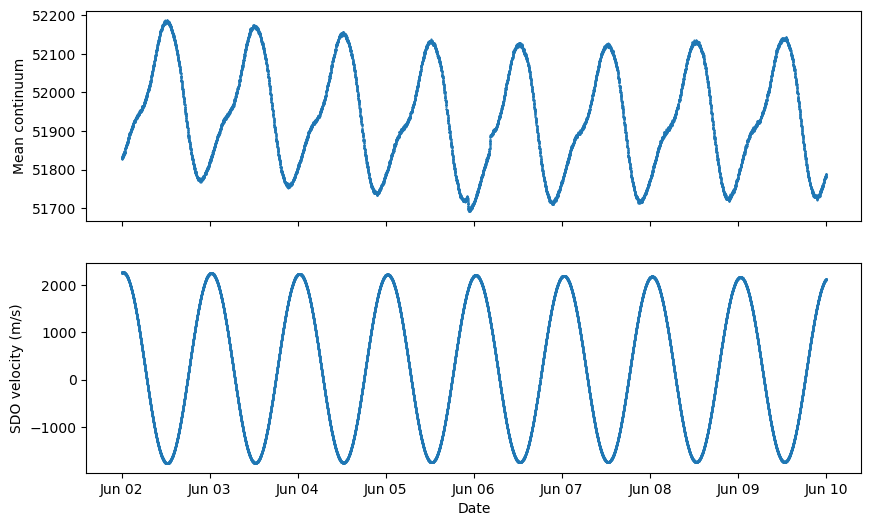

In [8]:
fig, ax = plt.subplots(2, 1, sharex=True, figsize=(10, 6))

axi = ax[0]
axi.plot(q.index, q.DATAMEAN, '.', ms=1)
axi.set_ylabel('Mean continuum')

axi = ax[1]
axi.plot(q.index, q.OBS_VR, '.', ms=1)
axi.set_ylabel('SDO velocity (m/s)')
axi.set_xlabel('Date')

axi.xaxis.set_major_locator(dates.AutoDateLocator())
axi.xaxis.set_major_formatter(dates.DateFormatter('%b %d'))